## make stims

In [1]:
from starling_rhythm.utils.paths import PROCESSED_DIR, ensure_dir

In [2]:
PROCESSED_DIR

PosixPath('/mnt/cube/j8xing/starling_rhythm_mfdfa/data')

In [3]:
bID = 's_b1555_22'

In [4]:
motif_dir = PROCESSED_DIR / bID / 'motifs'

In [5]:
motifs = list(motif_dir.glob('*.wav'))

In [6]:
str(motifs[0]).split('/')[-1].split('.')[0]

'motif58'

## design

10 repetition of the motifs, 5 gaps will be accelerating, 5 gaps will decelerate. Rate can be controlled by a single variable

In [7]:
from scipy.io.wavfile import read, write
from starling_rhythm.synth import taper_audio, float32_to_int16
import numpy as np
import pandas as pd

In [8]:
import IPython

In [9]:
def output_gap_list(total_gap, kink_factor, gap_n):
    '''
    total_gap should be in samples
    kink_factor
    '''
    
    ## make acceleration logarithmic
    log_ramper = np.log(np.linspace(start = 1, stop = np.e, num = int(gap_n/2)))
    
    ## flip to decelerate
    log_ramper = np.concatenate([np.flip(log_ramper), log_ramper])
    
    ## generate isochronous baseline
    iso = np.full(len(log_ramper), np.mean(log_ramper))
    log_ramper = iso + kink_factor * log_ramper
    
    ## normalize to sum 1
    ratios = log_ramper / sum(log_ramper)
    
    gap_list = (ratios * total_gap).astype(int)
    
    return np.concatenate([gap_list, [0]])

In [10]:
def motif_accelritar_stim(motif_address, motif_n = 11, total_gap = 3*48000, kink_factor = 0):
    '''
    from a motif, output motif_accelritar_stim with a kink_factor
    return a dataframe with stimuli info
    '''
    
    rate, data = read(motif_address)
    
    motif_tile = np.tile(data, (motif_n, 1))
    
    gap_list = output_gap_list(total_gap, kink_factor, gap_n = motif_n)
    
    syn_song = []

    taper = 2*(rate/1000)
    
    for motif, gap in zip(motif_tile, gap_list):
        syn_song.append(taper_audio(motif, taper = int(taper)))
        syn_song.append(np.zeros(gap))

    syn_song = np.concatenate(syn_song)
    
    syn_song = float32_to_int16(syn_song)
    
    ## save info
    motif_id = str(motif_address).split('/')[-1].split('.')[0]
    filename = motif_id + '_' + str(kink_factor) + '.wav'
    directory = PROCESSED_DIR / 'accel_ritar_stims'
    
    SAVE_PATH = directory / filename
    ensure_dir(SAVE_PATH)
    
    write(SAVE_PATH, rate, syn_song)
    
    info = pd.DataFrame(
        {
            'motif_address': [motif_address],
            'motif_id': [motif_id], 
            'motif_n': [motif_n],
            'total_gap': [total_gap],
            'kink_factor': [kink_factor],
            'kink_std': np.std(gap_list[:-1]),
            'stimuli_path': [SAVE_PATH]
        }
    )
    
    return info

In [11]:
tester = motifs[1]

In [12]:
logs = []
for i, motif in zip(np.arange(0, 8), motifs[:8]):
    for kink in np.linspace(start = 0, stop = 1, num = 2):
        log_row = motif_accelritar_stim(motif, kink_factor = kink)
        log_row['id'] = i
        logs.append(log_row)

logs = pd.concat(logs)

In [13]:
logs

,motif_address,motif_id,motif_n,total_gap,kink_factor,kink_std,stimuli_path,id
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif58,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,0
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif58,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,0
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif24,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,1
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif24,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,1
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif23,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,2
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif23,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,2
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif51,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,3
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif51,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,3
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif56,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,4
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif56,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,4


In [14]:
import matplotlib.pyplot as plt

/home/AD/j8xing/anaconda3/envs/starling_rhythm/lib/python3.10/site-packages/matplotlib/axes/_axes.py:7628: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


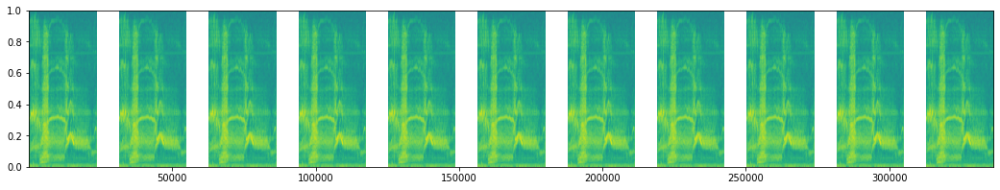

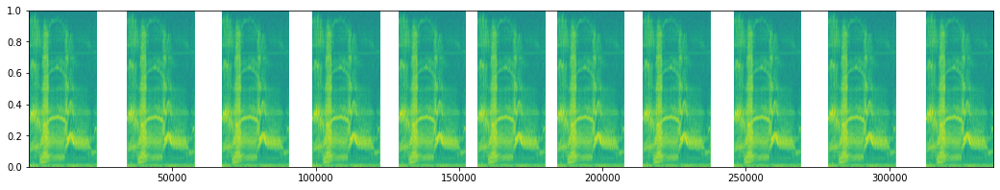

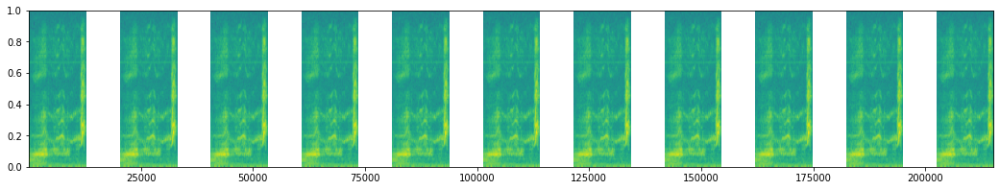

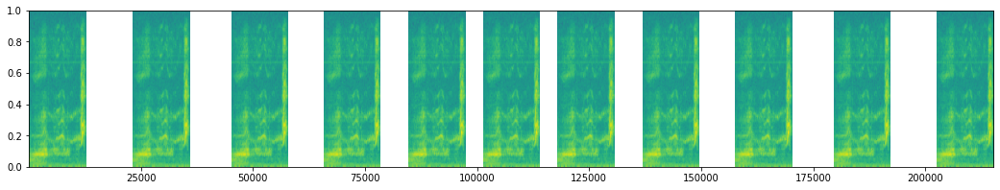

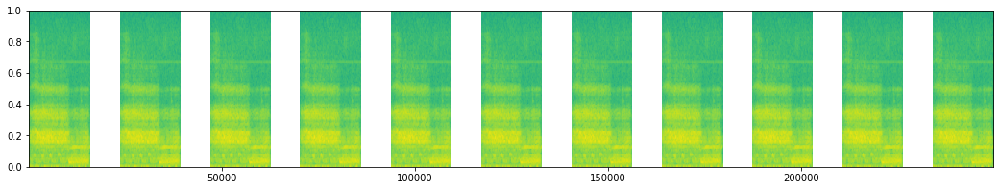

...

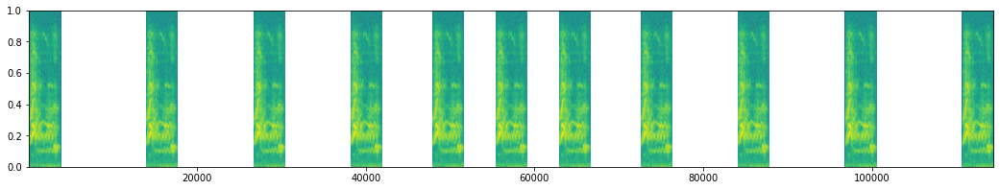

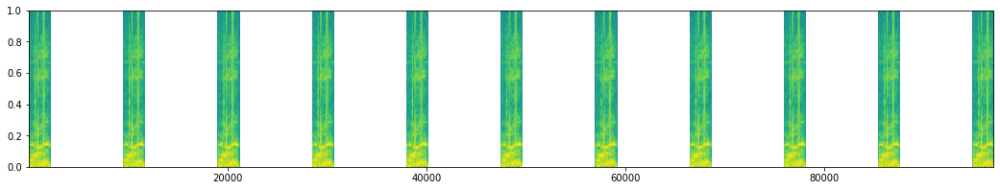

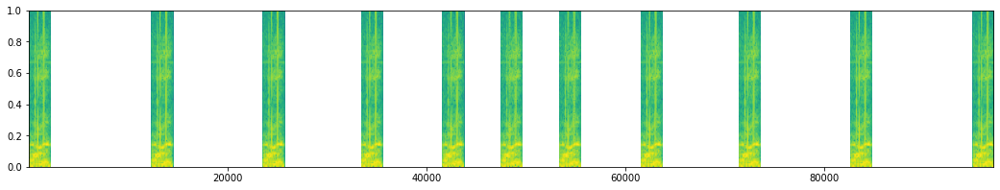

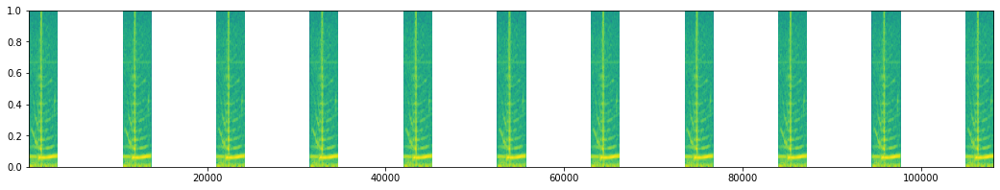

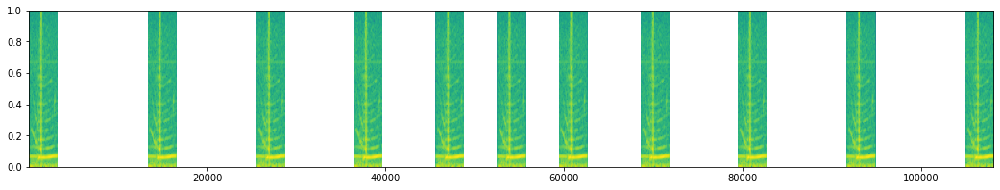

In [15]:
for stim in logs['stimuli_path'].values:
    plt.figure(figsize = [18, 3])
    spec = plt.specgram(read(stim)[1])
    IPython.display.display(IPython.display.Audio(str(stim)))

In [16]:
from joblib import Parallel, delayed
from tqdm.autonotebook import tqdm

/tmp/ipykernel_7897/123448108.py:2: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm


In [17]:
from starling_rhythm.mfdfa import tmf
n_jobs = 42
verbose = 0

In [18]:
def tmf_n(
    address, 
    ns = 32, 
    amp_env_sr = 200,
    n = 100
):

    with Parallel(n_jobs = n_jobs, verbose = verbose) as parallel:
        SDoTMF = parallel(
            delayed(tmf)(
                address,
                ns = 32,
                amp_env_sr = 200
            )
            for i in tqdm(np.arange(0, n), desc = 'shuffle')
        )
        
    return SDoTMF

In [19]:
tmfs = []

## for each stimuli
for stim in logs['stimuli_path'].values:
    tmfs.append(tmf_n(stim, n = 42))

shuffle: 100%|██████████| 42/42 [00:00<00:00, 11897.93it/s]


In [20]:
logs['tmfs'] = tmfs

In [21]:
logs['mean_tmf'] = np.mean(tmfs, axis = 1)

In [22]:
logs

,motif_address,motif_id,motif_n,total_gap,kink_factor,kink_std,stimuli_path,id,tmfs,mean_tmf
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif58,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,0,"[20.178356282943213, 14.744909026315435, 14.42...",15.169269
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif58,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,0,"[24.22584479502331, 16.58119884399019, 28.8747...",22.134860
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif24,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,1,"[27.976628946587283, 42.60015111135971, 27.864...",32.746488
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif24,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,1,"[50.17931655609908, 47.93319767694913, 67.0497...",50.540762
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif23,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,2,"[9.447748293418027, 10.581852051575295, 9.8483...",9.406033
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif23,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,2,"[18.31129489520218, 15.863504715329785, 11.407...",13.479799
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif51,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,3,"[24.726017027036054, 21.184137141506692, 21.43...",21.846325
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif51,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,3,"[30.165731554965987, 30.04622017016288, 30.567...",33.146739
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif56,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,4,"[-4.120666143423519, -1.9075138897799293, -1.5...",-2.027697
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif56,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,4,"[6.998695346645206, 7.759778382437138, 7.61722...",6.979696


In [23]:
from scipy.stats import zscore

In [24]:
zscore_corrected = []
for motif_id in np.unique(logs['motif_id'].values):
    motif_df = logs[logs['motif_id'] == motif_id]
    motif_df['z_motif'] = zscore(motif_df['mean_tmf'].values)
    zscore_corrected.append(motif_df)
    
zscore_corrected = pd.concat(zscore_corrected)

/tmp/ipykernel_7897/3080267796.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  motif_df['z_motif'] = zscore(motif_df['mean_tmf'].values)
/tmp/ipykernel_7897/3080267796.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  motif_df['z_motif'] = zscore(motif_df['mean_tmf'].values)
/tmp/ipykernel_7897/3080267796.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:

In [25]:
zscore_corrected

,motif_address,motif_id,motif_n,total_gap,kink_factor,kink_std,stimuli_path,id,tmfs,mean_tmf,z_motif
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif16,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,7,"[52.48474125505446, 41.97324075537458, 56.4086...",52.972059,-1.0
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif16,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,7,"[62.94606990968502, 67.35642986520155, 73.5308...",63.569630,1.0
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif18,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,6,"[48.91054370619004, 44.15364988328254, 61.6652...",45.950636,-1.0
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif18,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,6,"[73.17322318779892, 56.02518648234743, 67.9816...",64.246160,1.0
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif23,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,2,"[9.447748293418027, 10.581852051575295, 9.8483...",9.406033,-1.0
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif23,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,2,"[18.31129489520218, 15.863504715329785, 11.407...",13.479799,1.0
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif24,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,1,"[27.976628946587283, 42.60015111135971, 27.864...",32.746488,-1.0
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif24,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,1,"[50.17931655609908, 47.93319767694913, 67.0497...",50.540762,1.0
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif51,11,144000,0.0,0.000000,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,3,"[24.726017027036054, 21.184137141506692, 21.43...",21.846325,-1.0
0,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/s_...,motif51,11,144000,1.0,4532.303459,/mnt/cube/j8xing/starling_rhythm_mfdfa/data/ac...,3,"[30.165731554965987, 30.04622017016288, 30.567...",33.146739,1.0


In [26]:
## Pickle
from starling_rhythm.utils.paths import PROCESSED_DIR, ensure_dir
SAVE_PATH = PROCESSED_DIR / bID / 'accordion.pickle'
ensure_dir(SAVE_PATH)
zscore_corrected.to_pickle(SAVE_PATH)

In [27]:
import seaborn as sns

<AxesSubplot:xlabel='kink_factor', ylabel='z_motif'>

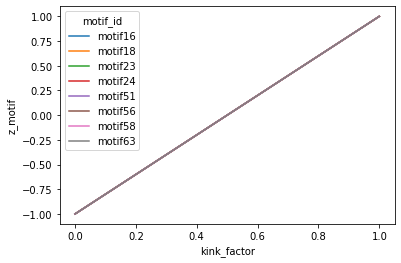

In [28]:
sns.lineplot(data = zscore_corrected.reset_index(), x = 'kink_factor', y = 'z_motif', hue = 'motif_id')

<AxesSubplot:xlabel='kink_factor', ylabel='z_motif'>

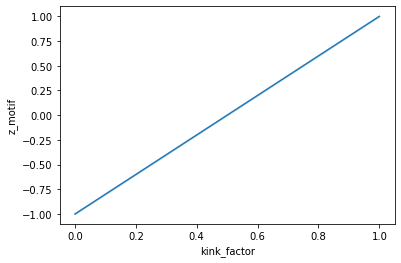

In [29]:
sns.lineplot(data = zscore_corrected.reset_index(), x = 'kink_factor', y = 'z_motif')